In [17]:
import sys, os
from pathlib import Path
import matplotlib.pyplot as plt
sys.path.insert(0, str(Path(os.getcwd()).parent)) # add parent directory to path to import python files from there 

import segmentation_helper
import plotting
import data_loader

import warnings
warnings.filterwarnings("ignore")

## Predict masks for dataset  
Predictions are made with every model in `MOD_DIR` for any image of a specific format (default= jpg) in the `PATH` directory.   
- `PATH` can contain sub-directories named 'train', 'test'; alternatively setting `do_subfolders=True` allows to use any existing subfolder.  
- Allowed image formats are: `jpg`, `png`, `tif`.
- Images with 'flow', 'flows','masks'or 'mask' in the file name will be ignored.
- Mask will be stored by default as tif files. 

In [18]:
#set the path to the folder that contains the images for segmentation
PATH = "F:/cellpose/fh/"
#set the path to the folder that contains the trained model(s)
MOD_DIR = "F:/cellpose/fh/train/models/"

In [19]:
#run the segmentation
segmentation_helper.batch_predict(MOD_DIR,PATH,mute=True,return_results=False,save_masks=True);

fh found...


F:/cellpose/fh//train/: 100%|██████████| 6/6 [00:20<00:00,  3.47s/image]


fh_boosted found...


F:/cellpose/fh//train/: 100%|██████████| 6/6 [00:36<00:00,  6.10s/image]


fh_boosted_2 found...


F:/cellpose/fh//train/: 100%|██████████| 6/6 [00:21<00:00,  3.60s/image]


## Predict masks for images in a specific folder   
This function takes in a directory containing images, and uses a pre-trained model to predict segmentation masks for the images.
If `return_results` is `True` respective lists of 1D arrays for predicted *masks*, *flows* and *styles* 
from `CellposeModel.eval()` are returned (see https://cellpose.readthedocs.io/en/latest/api.html#id5).

Parameters:
------------
`INP_DIR (str)` - Input directory 
model (obj) - Trained model from 'models.CellposeModel' class. Use either `models.CellposeModel(model_type='')` for built-in cellpose models or `models.CellposeModel(pretrained_model='')` for custom models. See https://cellpose.readthedocs.io/en/latest/models.html for more details.   
   
`image_format` (str(optional, default 'jpg')) - Image format of the images in `INP_DIR`   
`filter_str` (str(optional, default '')) - A string used to filter the images in `INP_DIR`   
`return_results` (bool(optional, default False)) - flag for returning predicted masks, flows and styles  
  
`TAR_DIR` (str(optional, default '')) - The directory to save the predicted masks to.  
`save_masks` (bool(optional, default True)) - flag for saving predicted mask as `.tif` files in `TAR_DIR`   
`mute` (bool (optional, default=False)) - flag for muting console output   
`mID` (str (optional, default = '')) - optional model name that will be written into output file names - will be later used to filter the results for a specific model.  

Parameters that can be handed down explicitly to `CellposeModel.eval()`,    
see https://cellpose.readthedocs.io/en/latest/api.html#id5 :   
   
`channels` (list (optional, default [0,0]))   
`diameter` (float (optional, default None))   
`rescale` (float (optional, default None))  
`min_size` (int (optional, default 15))    

In [20]:
#import the cellpose module for the model
from cellpose import models
#absolute path to images
PATH2 = "F:/cellpose/fh/train/"
#path to the trained model
MODEL_PATH = "F:/cellpose/fh/models/fh_boosted_1.170223"
#initialiize the model
model = models.CellposeModel(gpu=True, pretrained_model=MODEL_PATH)
#segement the images in PATH2
segmentation_helper.predict_folder(
    PATH2,image_format='jpg',diameter=None,
    return_results=False,model=model,save_masks=True,mute =True,mID='custom_model');

F:/cellpose/fh/train/: 100%|██████████| 6/6 [00:36<00:00,  6.14s/image]


## Inspect segmentations   
`imgs` - list of image paths    
`preds` -  list of prediction paths   
`lbls` - list of label paths (optional)  
`title` - title of plot (optional)   
`PATH` - path to save plot (optional)   

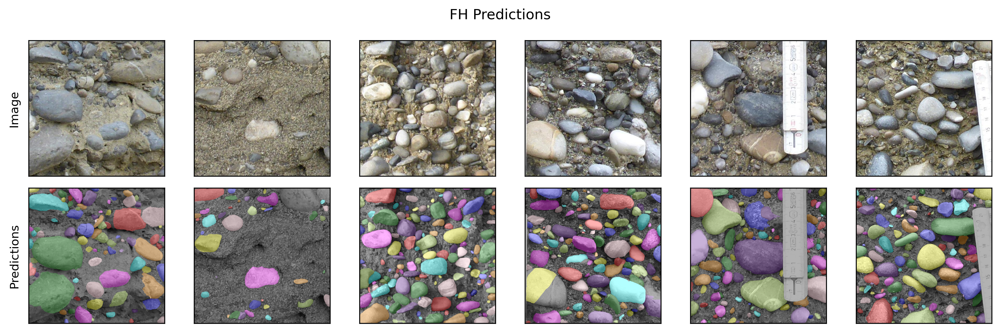

In [21]:
#load the images and predictions from PATH2
imgs,_,preds = data_loader.dataset_loader(PATH2,label_str='mask',pred_str='custom_model')
#show the results
pred_plot = plotting.inspect_predictions(imgs,preds,title='FH Predictions')

### Inspect segmentations, labels in images

In [22]:
#load the images and the predictions from file
imgs,lbls,preds = data_loader.dataset_loader(PATH,label_str='mask',pred_str='fh_pred')
_,_,preds_boosted = data_loader.dataset_loader(PATH,label_str='mask',pred_str='fh_boosted_pred')
_,_,preds_boosted_2 = data_loader.dataset_loader(PATH,label_str='mask',pred_str='fh_boosted_2')

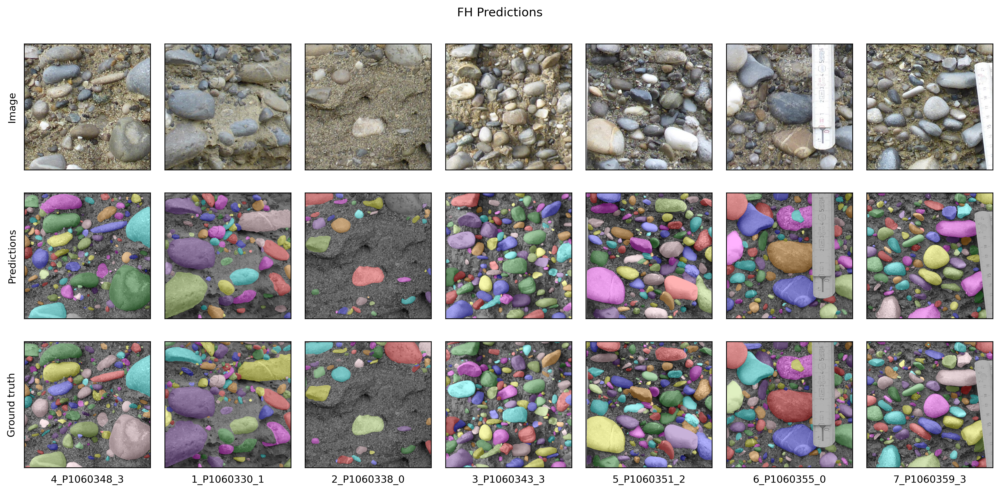

In [23]:
pred_label_plot = plotting.inspect_predictions(imgs,preds,lbls,title='FH Predictions')

## Evaluate segmentation performance  
If ground truth labels are available, the segmentation performance can be evaluated using the `eval_set()` function for a dataset with `test` and `train` folders or a single folder. For individual images, the `eval_image()` function can be used. Both functions save results to a `.pkl` file if enabled. If a test/train split in corresponding folders exist, by default results will be returned for the test set first.

Parameters:
------------
`imgs` (list) - List of images  
`lbls` (list) - List of labels  
`preds` (list) - List of predictions  
`dataID` (str (optional, default='')) - ID for the dataset  
`TAR_DIR` (str (optional, default='')) - Directory to save results to  
`thresholds` (list (optional, default=[0.5, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1])) - Thresholds to evaluate at  
`filters` (dict (optional, default={'edge':[False,.05],'px_cutoff':[False,10]})) - Dictionary of filters to apply to labels and predictions  
`filter_props` (list (optional, default=['label','area','centroid','major_axis_length','minor_axis_length'])) - pPoperties to filter on  
`save_results` (bool (optional, default=True)) - Flag whether to save results to a pkl file  
`return_results` (bool (optional, default=True)) - Flag whether to return results  

Returns
------------
`eval_results` (dict) - Dictionary of evaluation results if enabled

In [24]:
filters={'edge':[True,.05],'px_cutoff':[True,10]}

In [25]:
#eval mAP for IoU values (by default 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95. 1.0)
eval_results = segmentation_helper.eval_set(imgs,preds,lbls,dataID='FH',filters=filters)
eval_results_boosted = segmentation_helper.eval_set(imgs,lbls,preds_boosted,dataID='FH_boosted',filters=filters)
eval_results_boosted_2 = segmentation_helper.eval_set(imgs,lbls,preds_boosted,dataID='FH_boosted_2',filters=filters)

### Plot segmentation performance

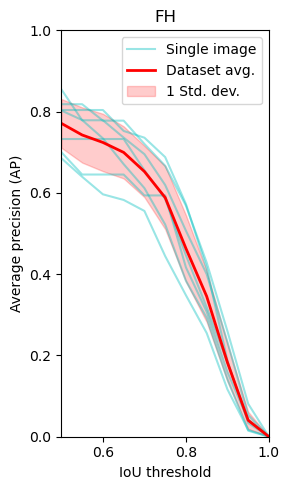

In [26]:
plt.figure(figsize=(3,5))
plotting.AP_IoU_plot(eval_results,title='FH')

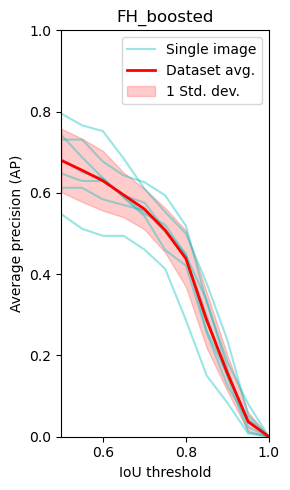

In [27]:
plt.figure(figsize=(3,5))
plotting.AP_IoU_plot(eval_results_boosted,title='FH_boosted')

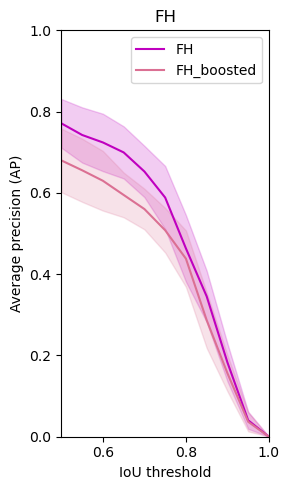

In [28]:
elem = {
    'dataset':'FH',
    'model_ID':['FH','FH_boosted'],
    'colors':['m','palevioletred'],
    'images':False,
    'SD':True,
    'avg_model':True
    }

plt.figure(figsize=(3,5))
plotting.AP_IoU_summary_plot([eval_results,eval_results_boosted],elem)